# PyCaret，SHAP

In [1]:
%matplotlib inline

import matplotlib.pyplot as plt

import pycaret
import pandas as pd
from pycaret.regression import *
from pycaret.utils import enable_colab
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

import pandas_profiling as pdp

import shap

In [2]:
enable_colab()

Colab mode enabled.


In [4]:
df = pd.read_csv('data\\boston.csv')

train, test = train_test_split(df, random_state=53)

## EDA

In [7]:
#pdp.ProfileReport(df, title='Boston data')

## データ入力，前処理の実行

#### setup()の実行
- 各変数の方を推定
- 推定が正しければ Enterキー，そうでなければ quit を入力
- 型の推定が誤っている変数については、setup()へ明示的に型を指定可能
- 引数 'silent = True' とすることでこのステップをスキップできる
- 'feature_selection = True' とすることで，特徴量が自動で選択される．ランダムフォレスト，AdaBoost，目的変数との線形相関といった複数のPermutation Importance の組み合わせに基づいて選択される．その際，'feature_selection_method' を'classic' か 'boruta'を指定できる．'feature_selection_threshold' を指定すること特徴量選択に使用される閾値を調整できる．値が大きいほど，選択される特徴量は多くなる．低い値に設定すると効率的ではあるが，アンダーフィットになる可能性がある．

In [8]:
reg1 = setup(data = train,
             train_size = 0.7, #学習データと検証データを7:3に分割
             target = 'house prices',
             #numeric_imputation = 'mean', # 欠損値を平均値で補完する
             categorical_features = ['CHAS'], # カテゴリ変数を指定
             #ignore_features = ['ZN', 'CHAS', 'AGE', 'RAD', 'TAX', 'B'], # 無視する特徴量を指定
             feature_selection = True,
             feature_selection_threshold=0.3, # 値が大きいほど，選択される特徴量の数が多くなる．
             feature_selection_method='classic', # Permutation Importanvceによる選択．’boruta’とするとランダムフォレストと検定を用いた特徴量選択アルゴリズムを用いる．
             normalize = True, # 標準化の有無
             normalize_method = 'zscore', # 標準化の方法（'zscore'，'minmax'，'maxabs'，'robust'）
             #pca=True, # 主成分分析による次元削除
             #pca_method='linear', # 次元削除の方法（'linear'，'kernel'）
             #profile=True, # pandas-progiling によるEDA
             #log_data=True, # 学習データと検証データのCSVへの出力
             silent = True # 型推定の確認をスキップ
             ) 

,Description,Value
0,session_id,6077
1,Target,house prices
2,Original Data,"(379, 14)"
3,Missing Values,False
4,Numeric Features,12
5,Categorical Features,1
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(265, 6)"


In [9]:
# 複数のモデルの実行，比較
compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,2.3238,11.5747,3.2946,0.8565,0.1534,0.1187,0.504
gbr,Gradient Boosting Regressor,2.3997,11.9694,3.3584,0.8498,0.1608,0.1247,0.086
rf,Random Forest Regressor,2.4677,14.1303,3.6048,0.8261,0.1661,0.1264,0.595
ada,AdaBoost Regressor,2.8285,15.3279,3.7281,0.8112,0.1722,0.1445,0.135
knn,K Neighbors Regressor,2.8067,17.6004,4.0506,0.7901,0.1698,0.1335,0.068
lightgbm,Light Gradient Boosting Machine,2.8530,18.4137,4.1277,0.7704,0.1823,0.1421,0.089
br,Bayesian Ridge,3.4384,23.3276,4.7380,0.7127,0.2819,0.1782,0.025
ridge,Ridge Regression,3.4483,23.3630,4.7430,0.7119,0.2821,0.1789,0.022
lar,Least Angle Regression,3.4528,23.3815,4.7455,0.7115,0.2823,0.1793,0.027
lr,Linear Regression,3.4528,23.3815,4.7455,0.7115,0.2823,0.1793,0.461


ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=-1, oob_score=False,
                    random_state=6077, verbose=0, warm_start=False)

In [10]:
X = get_config('X') #全ての説明変数
X

,PTRATIO,RM,DIS,INDUS,LSTAT,AGE
395,0.835721,0.295232,-1.018236,1.162273,0.787731,1.134773
165,-1.602844,-0.300855,-0.744016,1.388956,-0.326368,0.928687
282,-1.514169,1.934472,0.581381,-1.074337,-1.364159,-0.609850
146,-1.602844,-1.045965,-1.109643,1.388956,0.711422,1.177411
307,0.037645,0.742298,-0.332686,-1.240571,-0.677386,0.122110
...,...,...,...,...,...,...
251,0.348008,0.146210,1.586855,-0.681419,-1.272590,-2.059558
421,0.835721,-0.449877,-0.926829,1.162273,0.574068,1.010411
373,0.835721,-2.089117,-1.246753,1.162273,3.489039,1.177411
285,-1.336819,0.295232,1.541152,-1.240571,-0.570555,-1.242321


In [11]:
y = get_config('y') # 全ての目的変数
y

395    13.100000
165    25.000000
282    46.000000
146    15.600000
307    28.200001
         ...    
251    24.799999
421    14.200000
373    13.800000
285    22.000000
25     13.900000
Name: house prices, Length: 379, dtype: float32

In [12]:
#X_train = get_config('X_train') # 分割後の学習用説明変数
#X_train.head()

In [13]:
#y_train = get_config('y_train') # 分割後の学習用目的変数
#y_train.head()

In [14]:
#X_val = get_config('X_test') # 分割後の検証用説明変数
#X_val.head()

In [15]:
#y_val = get_config('y_test') # 分割後の検証用目的変数
#y_val.head()

### 評価指標

- RMSE

|項目|概要|
|:----------|:---------------|
| 判断基準 | 0に近い程良い |
| 特徴         | 大きく予測を外した場合を重要視している            <br>予測を大きく外すと大幅に大きくなる傾向にある<br>回帰モデルの最も一般的な性能評価指標として用いられる |

- R2（決定係数）

|項目|概要|
|:----------|:---------------|
| 判断基準 | 0.6以下：全然予測できてない<br>0.8以上：良いモデル<br>0.9以上：過学習の可能性あり |
| 特徴         | 大きく予測を外した場合を重要視している<br>予測を大きく外すと大幅に大きくなる傾向にある              |


### 複数の推定器を個別に実行する

#### 結果，精度の可視化

- create_model() で引数として，モデルを渡すとモデルを生成できる．初期設定では，クロスバリデーション（K-Fold =10） で実行される．

- ハイパーパラメータの最適化は，tune_model() を使う．第一引数にはモデル，第二引数にはランダムグリッドサーチの回数，第三引数には最適化の対象を渡す.

- evaluate_model() によって，モデルの解析結果を表示できる．タブを切り替えることでモデルの複数の概要がわかる．
  - Error Plot
    
    横軸に実際の値，縦軸に予測値をプロットする．予測が完全であれば、傾き1の直線上に点が乗る．点が傾き1の直線周辺に集まるモデルが良いモデルになる．予測値が大きい領域では誤差が大きくなっているように見える．
  - Learning Curve（学習曲線）
  
    データ数に応じた予測精度を表示するグラフで，横軸にデータサイズ，縦軸に予測精度をプロットする．良いモデルの指標としてはデータが増えるごとにtraining scoreが減少し，cross validation scoreが増加することが望ましい．cross validation scoreとtraining scoreの差が大きかった場合は，学習数が足りてない恐れがあるため，データ数を増やすことでモデルの精度の向上が図れる．

    訓練データが少ない場合は，モデルはオーバーパラメトライズの状態になり，train-trainの精度が高く，train-testの精度が低くなります。これは過学習状態であるとも言える．過学習を起こすのは、サンプル数が少ないにも関わらず、モデルが複雑（特徴量が多い・パラメーター数が多い）すぎる場合が多い．そのため，過学習への対策として，サンプル数を増やすか、モデルのパラメーター数を減らすか（特徴量を減らすか）がある．
  - Feature Importance（寄与度）

    目的変数に及ぼす影響が大きい順に上から特徴量が上位10まで表示される．

#### Extra Trees モデル

In [16]:
# Extra Trees Regressor を実行
et = create_model('et')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,2.0198,6.9214,2.6308,0.9045,0.1392,0.1134
1,2.3826,12.6322,3.5542,0.9042,0.1385,0.1035
2,2.5206,12.6224,3.5528,0.8389,0.1415,0.1080
3,2.5493,10.0681,3.1730,0.8066,0.1592,0.1314
4,2.2948,12.6405,3.5553,0.7638,0.1785,0.1281
5,2.2388,8.1187,2.8493,0.9018,0.1752,0.1365
6,3.0744,30.6914,5.5400,0.7657,0.2071,0.1576
7,2.1509,9.3450,3.0570,0.8534,0.1443,0.0999
8,2.0529,7.0428,2.6538,0.9113,0.1397,0.1143
9,1.9540,5.6641,2.3799,0.9146,0.1112,0.0941


In [17]:
# Extra Trees Regressor のハイパーパラメータの最適化
tuned_et = tune_model(et, n_iter = 100, optimize = 'rmse')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,2.1887,7.1754,2.6787,0.9010,0.1280,0.1137
1,2.7267,20.2383,4.4987,0.8465,0.1605,0.1140
2,2.4754,11.7368,3.4259,0.8502,0.1367,0.1039
3,2.4404,10.0229,3.1659,0.8075,0.1649,0.1328
4,2.3359,12.8803,3.5889,0.7593,0.1832,0.1311
5,2.3327,8.5411,2.9225,0.8966,0.1772,0.1430
6,3.3937,36.8123,6.0673,0.7190,0.2264,0.1729
7,2.1187,8.3289,2.8860,0.8694,0.1209,0.0955
8,2.1989,8.4735,2.9109,0.8932,0.1438,0.1154
9,2.0344,5.7268,2.3931,0.9137,0.1112,0.0992


In [18]:
# 結果の確認
evaluate_model(tuned_et)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [69]:
plot_model(tuned_et, plot='residuals_interactive')

'residuals_interactive'

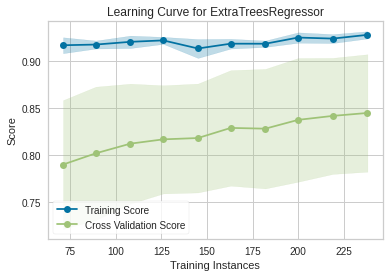

In [81]:
# 学習曲線
plot_model(tuned_et,plot='learning')

In [21]:
plot_model(tuned_et, plot='parameter')

,Parameters
bootstrap,False
ccp_alpha,0.0
criterion,mse
max_depth,10
max_features,1.0
max_leaf_nodes,None
max_samples,None
min_impurity_decrease,0.001
min_impurity_split,None
min_samples_leaf,2


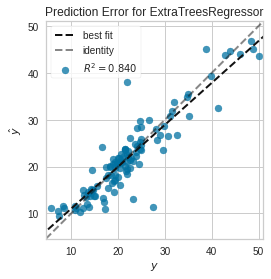

In [79]:
# Validation Curve
plot_model(tuned_et, plot='error') #save=True にすると png で保存可能

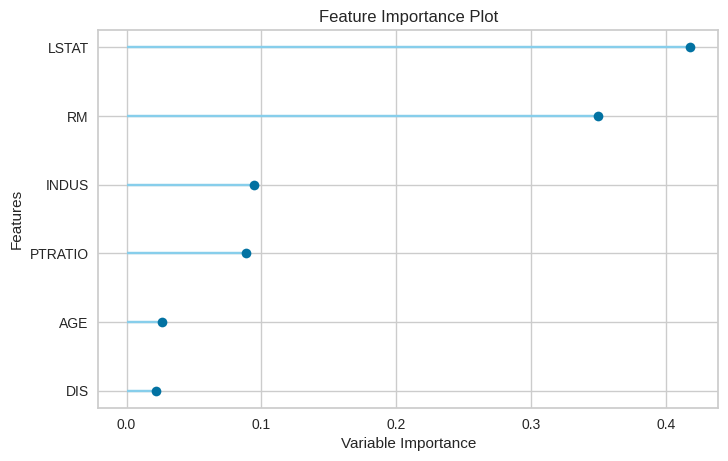

In [77]:
# Feature Importance
plot_model(tuned_et, plot='feature')

In [83]:
# SHAPによるモデルの解釈(dependence_plot)
interpret_model(tuned_et, plot = 'correlation', save=True)

In [84]:
# 予測結果
predictions_et = predict_model(tuned_et, data=test)
predictions_et.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,house prices,Label
111,0.1,0.0,10.0,0.0,0.5,6.7,81.6,2.7,6.0,432.0,17.8,395.6,10.2,22.8,24.806934
236,0.5,0.0,6.2,1.0,0.5,6.6,76.5,4.1,8.0,307.0,17.4,388.4,9.5,25.1,25.468283
232,0.6,0.0,6.2,0.0,0.5,8.3,73.3,3.8,8.0,307.0,17.4,385.9,2.5,41.7,46.349587
48,0.3,0.0,6.9,0.0,0.4,5.4,95.3,5.9,3.0,233.0,17.9,396.9,30.8,14.4,17.211449
473,4.6,0.0,18.1,0.0,0.6,7.0,67.6,2.5,24.0,666.0,20.2,374.7,11.7,29.8,22.653192


#### Ramdom Forest の実行

In [85]:
# Random Forest Regressor を実行
rf = create_model('rf')

# Random Forest のハイパーパラメータの最適化
tuned_rf = tune_model(rf, n_iter = 100, optimize = 'rmse')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,1.9940,6.2544,2.5009,0.9137,0.1239,0.1061
1,2.6319,20.2627,4.5014,0.8464,0.1476,0.1046
2,2.9072,16.6739,4.0834,0.7872,0.1623,0.1247
3,2.5917,11.5769,3.4025,0.7776,0.1798,0.1383
4,2.3568,14.1587,3.7628,0.7354,0.1870,0.1278
5,2.0520,7.4045,2.7211,0.9104,0.1730,0.1286
6,3.3525,35.9501,5.9958,0.7255,0.2199,0.1696
7,2.0563,7.7985,2.7926,0.8777,0.1174,0.0908
8,2.0880,7.9880,2.8263,0.8994,0.1282,0.1032
9,2.0596,6.0532,2.4603,0.9087,0.1077,0.0967


In [86]:
# 結果の確認
evaluate_model(tuned_rf)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

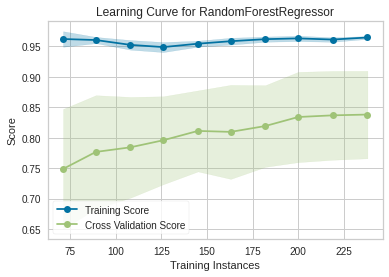

In [87]:
# 学習の精度
plot_model(estimator = tuned_rf, plot = 'learning')

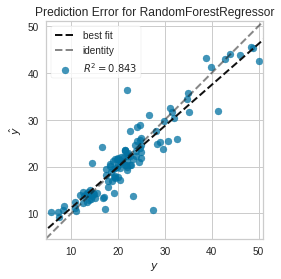

In [88]:
# Prediction Error Plot
plot_model(estimator = tuned_rf, plot = 'error')

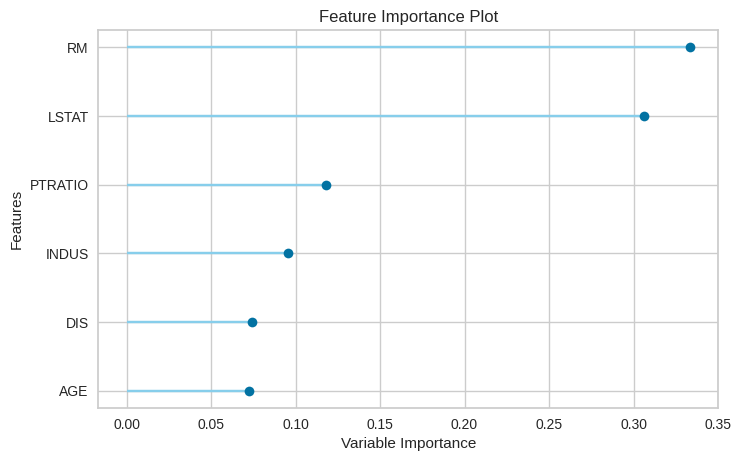

In [89]:
# Feature Importance
plot_model(estimator=tuned_rf, plot='feature')

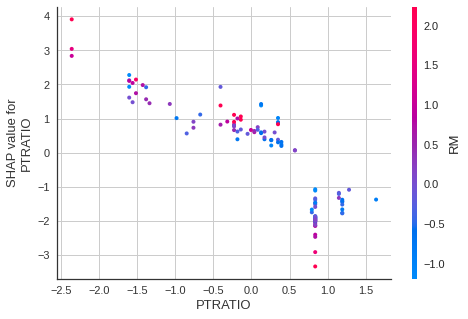

In [90]:
# SHAPによるモデルの解釈(dependence_plot)
interpret_model(tuned_rf, plot = 'correlation')

In [91]:
# 予測結果
predictions_rf = predict_model(tuned_rf, data=test)
predictions_rf.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,house prices,Label
111,0.1,0.0,10.0,0.0,0.5,6.7,81.6,2.7,6.0,432.0,17.8,395.6,10.2,22.8,23.101957
236,0.5,0.0,6.2,1.0,0.5,6.6,76.5,4.1,8.0,307.0,17.4,388.4,9.5,25.1,25.264348
232,0.6,0.0,6.2,0.0,0.5,8.3,73.3,3.8,8.0,307.0,17.4,385.9,2.5,41.7,45.048044
48,0.3,0.0,6.9,0.0,0.4,5.4,95.3,5.9,3.0,233.0,17.9,396.9,30.8,14.4,17.123913
473,4.6,0.0,18.1,0.0,0.6,7.0,67.6,2.5,24.0,666.0,20.2,374.7,11.7,29.8,23.051304


#### LightGBM の実行

In [92]:
# LightGBM を実行
lgbm = create_model('lightgbm')

# LightGBM のハイパーパラメータの最適化
tuned_lgbm = tune_model(lgbm, n_iter = 100, optimize = 'rmse')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,2.4353,9.0064,3.0011,0.8757,0.1636,0.1369
1,2.6554,17.3998,4.1713,0.8681,0.1359,0.1052
2,2.6340,12.2082,3.4940,0.8442,0.1450,0.1153
3,2.5404,9.9810,3.1593,0.8083,0.1721,0.1442
4,2.3807,9.7966,3.1300,0.8169,0.1789,0.1378
5,2.4641,8.4631,2.9091,0.8976,0.1836,0.1540
6,3.6374,39.3877,6.2760,0.6993,0.2163,0.1715
7,3.1321,22.1201,4.7032,0.6531,0.1736,0.1318
8,2.4412,10.4286,3.2293,0.8686,0.1490,0.1234
9,2.0821,6.1297,2.4758,0.9076,0.1098,0.0972


In [93]:
# 結果の確認
evaluate_model(tuned_lgbm)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

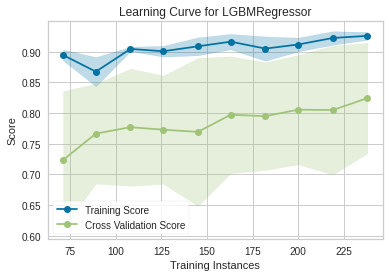

In [94]:
# 学習の精度
plot_model(estimator = tuned_lgbm, plot = 'learning')

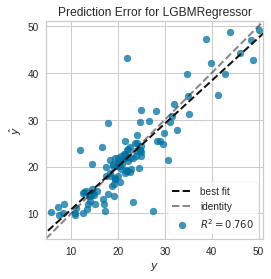

In [95]:
# Prediction Error Plot
plot_model(estimator = tuned_lgbm, plot = 'error')

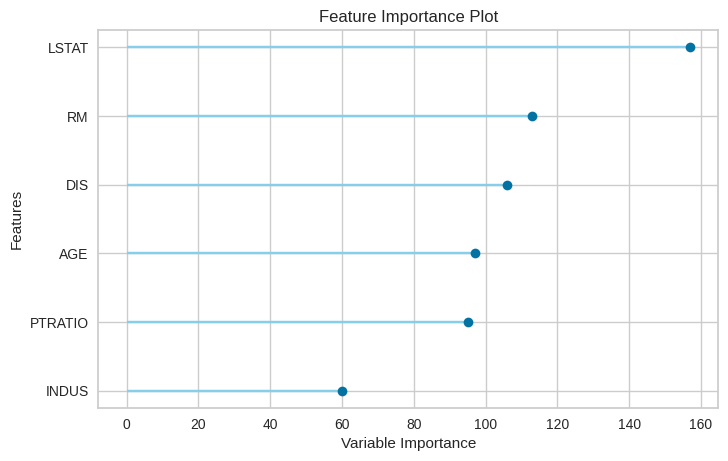

In [96]:
# Feature Importance
plot_model(estimator=tuned_lgbm, plot='feature')

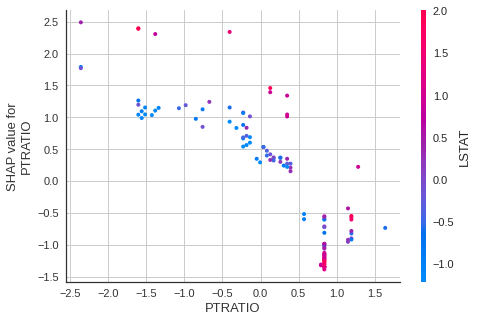

In [97]:
# SHAPによるモデルの解釈(dependence_plot)
interpret_model(tuned_lgbm, plot = 'correlation')

In [98]:
# 予測結果
predictions_lgbm = predict_model(tuned_lgbm, data=test)
predictions_lgbm.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,house prices,Label
111,0.1,0.0,10.0,0.0,0.5,6.7,81.6,2.7,6.0,432.0,17.8,395.6,10.2,22.8,23.804629
236,0.5,0.0,6.2,1.0,0.5,6.6,76.5,4.1,8.0,307.0,17.4,388.4,9.5,25.1,24.834255
232,0.6,0.0,6.2,0.0,0.5,8.3,73.3,3.8,8.0,307.0,17.4,385.9,2.5,41.7,42.718041
48,0.3,0.0,6.9,0.0,0.4,5.4,95.3,5.9,3.0,233.0,17.9,396.9,30.8,14.4,17.832095
473,4.6,0.0,18.1,0.0,0.6,7.0,67.6,2.5,24.0,666.0,20.2,374.7,11.7,29.8,21.567895


#### モデルのアンサンブル

アンサンブル，ブレンド，スタッキングが可能

In [99]:
ensemble = blend_models([tuned_et, tuned_rf, tuned_lgbm])

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,2.0691,6.0237,2.4543,0.9169,0.1290,0.1124
1,2.5526,18.4826,4.2991,0.8599,0.1380,0.1019
2,2.4936,12.6173,3.5521,0.8389,0.1440,0.1072
3,2.3114,9.1275,3.0212,0.8247,0.1639,0.1305
4,2.2126,10.9499,3.3091,0.7954,0.1759,0.1250
5,2.1740,7.1079,2.6661,0.9140,0.1743,0.1386
6,3.3656,36.5691,6.0472,0.7208,0.2172,0.1649
7,2.3662,10.9857,3.3145,0.8277,0.1314,0.1030
8,2.1551,7.7907,2.7912,0.9018,0.1342,0.1104
9,1.9820,5.3415,2.3112,0.9195,0.1027,0.0941


In [100]:
# スタッキング
gbr = create_model('gbr')

stacker = stack_models([tuned_et, tuned_rf, tuned_lgbm], meta_model=gbr)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,2.0163,7.3186,2.7053,0.8990,0.1348,0.1064
1,2.4956,17.3131,4.1609,0.8687,0.1391,0.1054
2,2.9098,17.4792,4.1808,0.7769,0.1728,0.1299
3,2.6492,11.3182,3.3643,0.7826,0.1827,0.1410
4,2.3901,15.4434,3.9298,0.7114,0.1898,0.1271
5,2.2732,9.2425,3.0401,0.8882,0.1858,0.1428
6,3.0183,26.8623,5.1829,0.7949,0.2172,0.1750
7,2.2714,8.1706,2.8584,0.8719,0.1322,0.1063
8,2.0973,6.7980,2.6073,0.9143,0.1267,0.1062
9,1.9462,6.4812,2.5458,0.9023,0.1363,0.0955


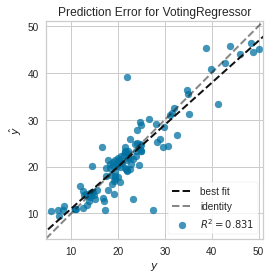

In [101]:
plot_model(ensemble, plot='error')

In [102]:
plot_model(ensemble, plot='learning', save=True)

'Learning Curve.png'

In [103]:
evaluate_model(ensemble)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [104]:
pred_ensemble = predict_model(ensemble, data=test)
pred_ensemble

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,house prices,Label
111,0.1,0.0,10.0,0.0,0.5,6.7,81.6,2.7,6.0,432.0,17.8,395.6,10.2,22.8,23.904507
236,0.5,0.0,6.2,1.0,0.5,6.6,76.5,4.1,8.0,307.0,17.4,388.4,9.5,25.1,25.188962
232,0.6,0.0,6.2,0.0,0.5,8.3,73.3,3.8,8.0,307.0,17.4,385.9,2.5,41.7,44.705224
48,0.3,0.0,6.9,0.0,0.4,5.4,95.3,5.9,3.0,233.0,17.9,396.9,30.8,14.4,17.389152
473,4.6,0.0,18.1,0.0,0.6,7.0,67.6,2.5,24.0,666.0,20.2,374.7,11.7,29.8,22.424131
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
246,0.3,22.0,5.9,0.0,0.4,6.1,34.9,8.1,7.0,330.0,19.1,390.2,9.2,24.3,21.384551
138,0.2,0.0,21.9,0.0,0.6,5.9,98.2,1.7,4.0,437.0,21.2,392.0,21.3,13.3,13.288639
477,15.0,0.0,18.1,0.0,0.6,5.3,97.3,2.1,24.0,666.0,20.2,349.5,24.9,12.0,11.535509
432,6.4,0.0,18.1,0.0,0.6,6.4,74.8,2.2,24.0,666.0,20.2,98.0,12.0,16.1,20.780678


## SHAPによるモデルの解釈

### SHAP（SHapley Additive exPlanations）とは
SHAPとは，shapley値を用いて，予測結果に対して特徴量がどのように寄与するかを可視化する方法．

shapley値とは限界貢献度の期待値（平均値）nokoto.
機械学習に当てはめる場合．予測した値に対して，それぞれの特徴量が予測にどのような影響を与えたかを算出した値と言える．

### method
TreeExplainer()は勾配ブースティング（XGBoost, LightGBM, CatBoostなど）で作成したモデルを読み込み、shapley値を導くためのインスタンス.

#### 引数
- model_output: モデルの出力方法．margin(生データのshape値)，probability(確率空間に変換されたshapley値)，log_loss()がある．


### メリット
- 計算方法が公開されており，貢献度が数値化されるため，完全な透明性が求められる場合に有効
- データ数が少ない場合でも結果が安定
- 計算時間が少ない

### デメリット
- 計算できるアルゴリズムが限定的
- アンサンブルしたモデルには使用できない

In [105]:
# jupyter notebookにコードを表示させるためにjsをロード
shap.initjs()

explainer_et = shap.TreeExplainer(model=tuned_et, model_output='margin')
explainer_rf = shap.TreeExplainer(model=tuned_rf, model_output='margin')
explainer_lgbm = shap.TreeExplainer(model=tuned_lgbm, model_output='margin')

In [106]:
# shapley値の計算
shap_values_et = explainer_et.shap_values(X=X)
shap_values_rf = explainer_rf.shap_values(X=X)
shap_values_lgbm = explainer_lgbm.shap_values(X=X)

### Extra Tree について

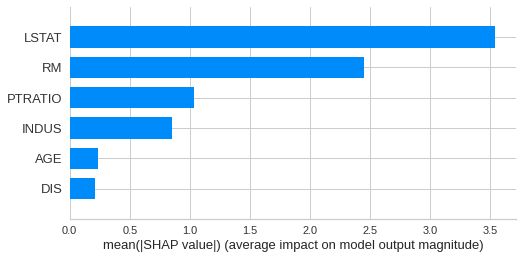

In [107]:
# etの特徴量の重要度
shap.initjs()
shap.summary_plot(shap_values_et, X, plot_type="bar")

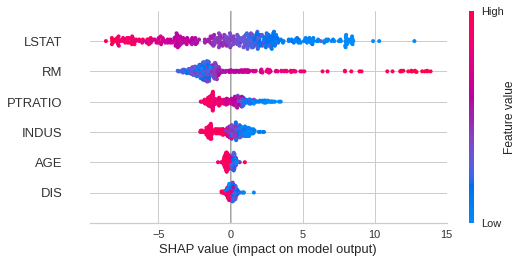

In [108]:
# etの相関関係
shap.initjs()
shap.summary_plot(shap_values_et, X)

In [109]:
# etのforce_plot(shapley値と特徴変数の寄与度)
shap.initjs()
shap.force_plot(base_value=explainer_et.expected_value, shap_values=shap_values_et, features=X)

In [110]:
# etのforce_plot(shapley値と特徴変数の寄与度)
shap.initjs()
shap.force_plot(base_value=explainer_et.expected_value, shap_values=shap_values_et[16,:], features=X.iloc[16,:])

### Random Forest について

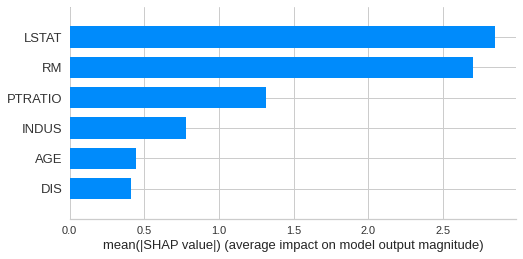

In [111]:
# rfの特徴量の重要度
shap.initjs()
shap.summary_plot(shap_values_rf, X, plot_type="bar")

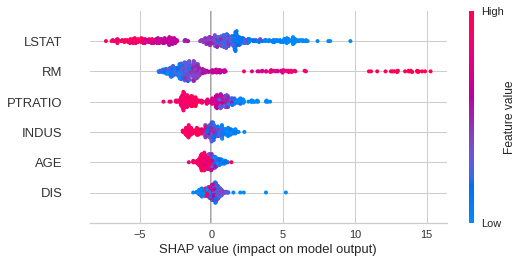

In [112]:
# rfの相関関係
shap.initjs()
shap.summary_plot(shap_values_rf, X)

In [113]:
# rfのforce_plot(shapley値と特徴変数の寄与度)
shap.initjs()
shap.force_plot(base_value=explainer_rf.expected_value, shap_values=shap_values_rf, features=X)

In [114]:
# rfのforce_plot(shapley値と特徴変数の寄与度)
shap.initjs()
shap.force_plot(base_value=explainer_rf.expected_value, shap_values=shap_values_rf[15,:], features=X.iloc[15,:])

### LightGBM について

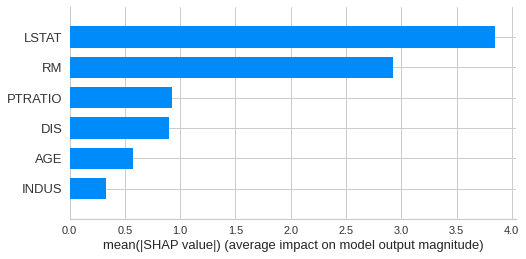

In [115]:
# lgbmの特徴量の重要度
shap.initjs()
shap.summary_plot(shap_values_lgbm, X, plot_type="bar")

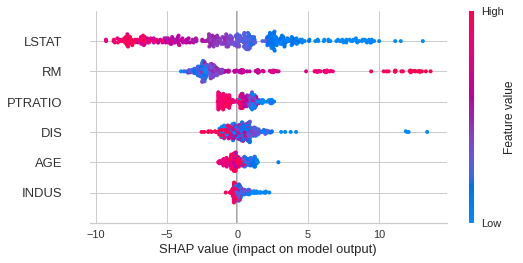

In [116]:
# lgbmの相関関係
shap.initjs()
shap.summary_plot(shap_values_lgbm, X)

In [117]:
# lgbmのforce_plot(shapley値と特徴変数の寄与度)
shap.initjs()
shap.force_plot(base_value=explainer_lgbm.expected_value, shap_values=shap_values_lgbm, features=X)

In [118]:
# lgbmのforce_plot(shapley値と特徴変数の寄与度)
shap.initjs()
shap.force_plot(base_value=explainer_lgbm.expected_value, shap_values=shap_values_lgbm[0,:], features=X.iloc[0,:])

#### モデルの確定

In [119]:
final = finalize_model(ensemble)
print(final)

VotingRegressor(estimators=[('et',
                             ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0,
                                                 criterion='mse', max_depth=10,
                                                 max_features=1.0,
                                                 max_leaf_nodes=None,
                                                 max_samples=None,
                                                 min_impurity_decrease=0.001,
                                                 min_impurity_split=None,
                                                 min_samples_leaf=2,
                                                 min_samples_split=10,
                                                 min_weight_fraction_leaf=0.0,
                                                 n_estimators=100, n_jobs=-1,
                                                 oob_score=False,
                                                 random_state=6077, v...
            

In [120]:
test[['CRIM', 'INDUS', 'NOX', 'RM', 'DIS', 'PTRATIO', 'LSTAT']]

,CRIM,INDUS,NOX,RM,DIS,PTRATIO,LSTAT
111,0.1,10.0,0.5,6.7,2.7,17.8,10.2
236,0.5,6.2,0.5,6.6,4.1,17.4,9.5
232,0.6,6.2,0.5,8.3,3.8,17.4,2.5
48,0.3,6.9,0.4,5.4,5.9,17.9,30.8
473,4.6,18.1,0.6,7.0,2.5,20.2,11.7
...,...,...,...,...,...,...,...
246,0.3,5.9,0.4,6.1,8.1,19.1,9.2
138,0.2,21.9,0.6,5.9,1.7,21.2,21.3
477,15.0,18.1,0.6,5.3,2.1,20.2,24.9
432,6.4,18.1,0.6,6.4,2.2,20.2,12.0


In [121]:
test.columns

Index(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX',
       'PTRATIO', 'B', 'LSTAT', 'house prices'],
      dtype='object')

In [122]:
final.score(test[X.columns], test['house prices'])

-0.0157574907327378

In [123]:
# モデルの保存

save_model(final, 'FinalModel')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=['CHAS'],
                                       display_types=False, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[],
                                       target='house prices',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numer...
                                                             feature_fraction=1.0,
                                                             importance_type='split',
                                                             learning_rate=0.1,
                        

In [124]:
# 保存したモデルを読み込む

#saved_model = load_model('Finalmodel.pkl')
#new_prediction = predict_model(saved_model, data=train)